# Preprocessing Pipeline

This notebook outlines the steps involved in preprocessing 3D medical images for analysis and model training. The preprocessing is divided into several functions, each performing a specific task to prepare the data for training deep learning models.

The dataset used in our experiments is the BraTS2019 dataset, which was collected from  [Kaggle](https://www.kaggle.com/datasets/aryashah2k/brain-tumor-segmentation-brats-2019). However, we believe that these preprocessing steps can be applied to other 3D images from the [Multimodal Brain Tumor Segmentation Challenges](https://www.med.upenn.edu/cbica/brats2019/data.html)

In [1]:
import nibabel as nib
import sys
import os
import sys, os
sys.path.insert(1, '../')
import matplotlib.pyplot as plt

from src.preprocessing import *

## Steps in the Preprocessing Pipeline

1. **N4 Bias Field Correction**
   - Applies N4 bias field correction to normalize the intensity in MRI images. This step enhances image quality by correcting intensity non-uniformity caused by field inhomogeneities.

2. **Cropping 3D Images**
   - Crops each 3D image to remove empty or redundant regions around the brain, focusing only on the regions containing useful information.

3. **Preprocessing and Saving Images and Masks**
   - Saves the preprocessed images as `X.npy` files and combined masks (Background (BG), Non-Tumor (NT), Tumor Core (TC), Enhancing Core (EC), Whole Tumor (WT)) as `Y.npy` files.
   - Normalizes the images using z-score and Gaussian normalization techniques.
   - Pads and reshapes the images and masks to ensure they fit a specific size and format.

4. **Creating the Dataset**
   - Filters the dataset to remove slices where there are no tumor regions present. This ensures the dataset is balanced and contains relevant data.

5. **Processing Folds**
   - Divides the dataset into multiple folds (5) for cross-validation. Each fold contains a subset of the dataset, ensuring diversity and robustness in model training.

6. **Data Structuring**
   - Concatenates all the processed images (`X.npy`) and masks (`Y.npy`) from different folds into larger, combined datasets for use in deep learning models.

7. **Data Splitting**
   - Shuffle and split the structured dataset into training and validation sets.
   - Training Set: Includes data from four folds (FoldX2, FoldX3, FoldX4, FoldX5) for model training.
   - Validation Set: Contains data from one fold (FoldX1) for model evaluation and hyperparameter tuning.
   - The Training and Validation set are available at [kaggle](https://www.kaggle.com/datasets/ahvshim/mri-brats2019-training-and-validation-splits/data)


In [2]:
pwd = os.path.abspath('../')

main_data = pwd + '/data/BraTS2019/'
n4_data   = pwd + '/data/interim/n4_data/'
crop_data = pwd + '/data/interim/cropped_data/'
pre_data  = pwd + '/data/interim/pre_data/' 
proc_data = pwd + '/data/interim/proc_data/'
fold_data = pwd + '/data/interim/fold_data/'

train_data = pwd + '/data/processed/train/'
valid_data = pwd + '/data/processed/valid/'

# # Example usage
N4BiasFieldCorrection(main_data, n4_data)
Crop_3D_Images(n4_data, crop_data, size = 192)
Process_Images(crop_data, pre_data)
Create_Dataset(pre_data, proc_data)
Process_Folds(proc_data, fold_data, f=5)
Struct_Folds(fold_data, fold_data)

In [3]:
###############
# SPLIT DATASET
###############
import random
import numpy as np

FoldX1 = np.load(fold_data + "X_0.npy")    # Images
FoldY1 = np.load(fold_data + "Y_0.npy")    # Masks
FoldX2 = np.load(fold_data + "X_1.npy")    # Images
FoldY2 = np.load(fold_data + "Y_1.npy")    # Masks
FoldX3 = np.load(fold_data + "X_2.npy")    # Images
FoldY3 = np.load(fold_data + "Y_2.npy")    # Masks
FoldX4 = np.load(fold_data + "X_3.npy")    # Images
FoldY4 = np.load(fold_data + "Y_3.npy")    # Masks
FoldX5 = np.load(fold_data + "X_4.npy")    # Images
FoldY5 = np.load(fold_data + "Y_4.npy")    # Masks

def shuffle(x, y):
    X_data = np.copy(x)
    Y_data = np.copy(y)
    
    for i in range(x.shape[0]):        
        num = random.randint(0, x.shape[0]-1)
        X_temp = np.copy(X_data[num])
        Y_temp = np.copy(Y_data[num])
        X_data[num] = np.copy(X_data[i])
        Y_data[num] = np.copy(Y_data[i])
        X_data[i] = X_temp
        Y_data[i] = Y_temp
    return X_data, Y_data

Xtrain = np.concatenate([FoldX2, FoldX3, FoldX4, FoldX5], axis = 0)
Ytrain = np.concatenate([FoldY2, FoldY3, FoldY4, FoldY5], axis = 0)
Xval = FoldX1
Yval = FoldY1

FoldX1, FoldX2, FoldX3, FoldX4, FoldX5 = 0,0,0,0,0
FoldY1, FoldY2, FoldY3, FoldY4, FoldY5 = 0,0,0,0,0

Xtrain, Ytrain = shuffle(Xtrain, Ytrain)
Xval, Yval = shuffle(Xval, Yval)

np.save(train_data + "Xtrain.npy", Xtrain)
np.save(train_data + "Ytrain.npy", Ytrain)
np.save(valid_data + "Xval.npy", Xval)
np.save(valid_data + "Yval.npy", Yval)

print('Xtrain :' + str(Xtrain.shape))
print('Ytrain :' + str(Ytrain.shape))
print('Xval :' + str(Xval.shape))
print('Yval :' + str(Yval.shape))

Xtrain :(5512, 192, 192, 4)
Ytrain :(5512, 192, 192, 5)
Xval :(1311, 192, 192, 4)
Yval :(1311, 192, 192, 5)


In [4]:
#########################################
# LOAD DATA FROM train and valid folders
#########################################

Xtrain = np.load(train_data + "Xtrain.npy", mmap_mode='r')
Ytrain = np.load(train_data + "Ytrain.npy", mmap_mode='r')
Xval = np.load(valid_data + "Xval.npy", mmap_mode='r')
Yval = np.load(valid_data + "Yval.npy", mmap_mode='r')

print('Xtrain :' + str(Xtrain.shape))
print('Ytrain :' + str(Ytrain.shape))
print('Xval :' + str(Xval.shape))
print('Yval :' + str(Yval.shape))

Xtrain :(5512, 192, 192, 4)
Ytrain :(5512, 192, 192, 5)
Xval :(1311, 192, 192, 4)
Yval :(1311, 192, 192, 5)


In [5]:
# This is how our project structure looks like after finishing the processing
!tree -L 3 {pwd}

/home/ahmedsalim/projects/BRATS-Image-Segmentation
├── data
│   ├── BraTS2019
│   │   ├── HGG
│   │   └── LGG
│   ├── interim
│   │   ├── cropped_data
│   │   ├── fold_data
│   │   ├── n4_data
│   │   ├── pre_data
│   │   └── proc_data
│   └── processed
│       ├── train
│       └── valid
├── notebooks
│   ├── Brats_DL.ipynb
│   └── Brats_Prep.ipynb
├── requirements.txt
└── src
    ├── Modules.py
    ├── __init__.py
    ├── preprocessing
    │   ├── N4biasfieldcor.py
    │   ├── __init__.py
    │   ├── create_folds.py
    │   ├── image_cropper.py
    │   ├── image_processor.py
    │   └── utils.py
    └── utils.py

16 directories, 12 files


## EDA and Preprocessing Results

In [6]:
ORIFINAL_DIR = main_data + 'HGG/BraTS19_2013_10_1/'
N4_DIR = n4_data + 'HGG/BraTS19_2013_10_1/'

def load_image(filename, ORIFINAL_DIR):
    return nib.load(ORIFINAL_DIR + filename).get_fdata()

IMG_T1 = load_image("BraTS19_2013_10_1_t1.nii", ORIFINAL_DIR)
IMG_T1CE = load_image("BraTS19_2013_10_1_t1ce.nii", ORIFINAL_DIR)
IMG_T2 = load_image("BraTS19_2013_10_1_t2.nii", ORIFINAL_DIR)
IMG_FLAIR = load_image("BraTS19_2013_10_1_flair.nii", ORIFINAL_DIR)
IMG_SEG = load_image("BraTS19_2013_10_1_seg.nii", ORIFINAL_DIR)


N4_T1 = load_image("BraTS19_2013_10_1_t1.nii", N4_DIR)
N4_T1CE = load_image("BraTS19_2013_10_1_t1ce.nii", N4_DIR)
N4_T2 = load_image("BraTS19_2013_10_1_t2.nii", N4_DIR)
N4_FLAIR = load_image("BraTS19_2013_10_1_flair.nii", N4_DIR)
N4_SEG = load_image("BraTS19_2013_10_1_seg.nii", N4_DIR)


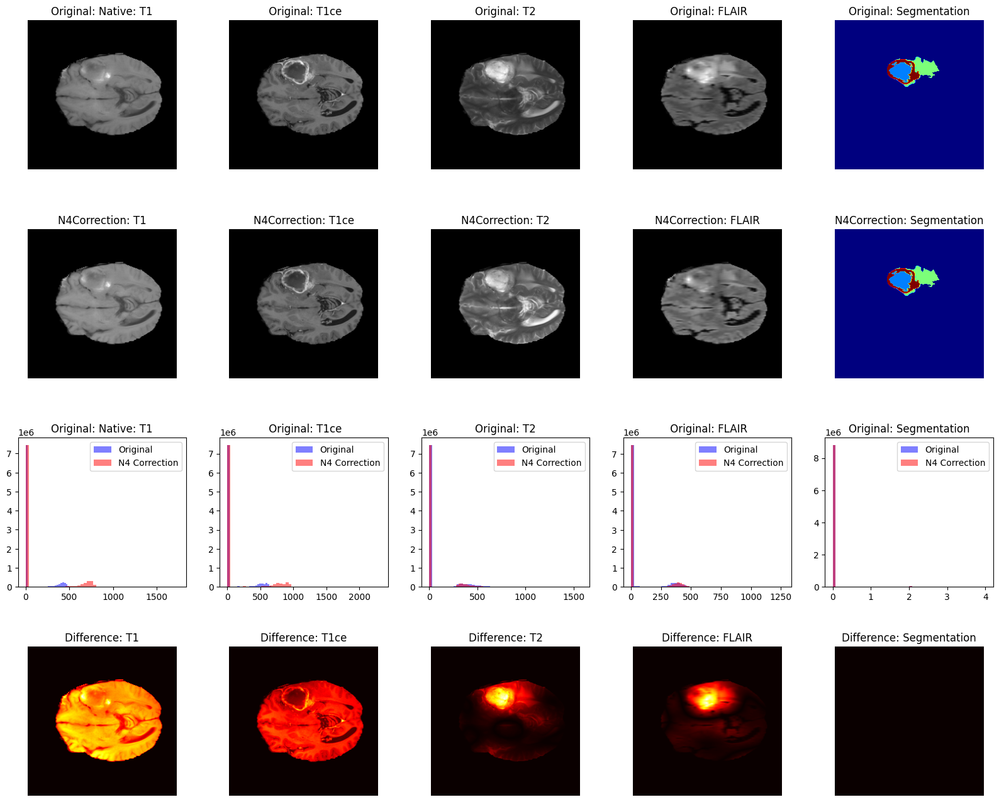

In [7]:
# Change SLICE_INDEX to select a different slice of the 3D images
SLICE_INDEX = 67

IMGS = [
    IMG_T1, IMG_T1CE, IMG_T2, IMG_FLAIR, IMG_SEG,
    N4_T1, N4_T1CE, N4_T2, N4_FLAIR, N4_SEG
]
        
TITLES = [
    "Original: Native: T1", " Original: T1ce", "Original: T2", " Original: FLAIR", "Original: Segmentation",
    "N4Correction: T1", "N4Correction: T1ce", "N4Correction: T2", "N4Correction: FLAIR", "N4Correction: Segmentation"
]
DIFF_IMGS = [
    np.abs(IMG_T1 - N4_T1), np.abs(IMG_T1CE - N4_T1CE),
    np.abs(IMG_T2 - N4_T2), np.abs(IMG_FLAIR - N4_FLAIR),
    np.abs(IMG_SEG - N4_SEG)
]
diff_TITLES = [
    "Difference: T1", "Difference: T1ce", "Difference: T2", "Difference: FLAIR", "Difference: Segmentation"
]

fig = plt.figure(figsize=(20, 16))
gs = fig.add_gridspec(4, 5, height_ratios=[1, 1, 1, 1], hspace=0.4)

axes_imgs = [fig.add_subplot(gs[0, i]) for i in range(5)]
axes_imgs += [fig.add_subplot(gs[1, i]) for i in range(5)]
axes_his = [fig.add_subplot(gs[2, i]) for i in range(5)]
axes_diff = [fig.add_subplot(gs[3, i]) for i in range(5)]

# IMAGES
for i, ax in enumerate(axes_imgs):
    ax.imshow(IMGS[i][:, :, SLICE_INDEX], cmap='jet' if i in [4, 9] else 'gray')
    ax.set_title(TITLES[i], fontsize=12)
    ax.axis('off')

# DIFFERENCE
for i, ax in enumerate(axes_diff):
    ax.imshow(DIFF_IMGS[i][:, :, SLICE_INDEX], cmap='hot')
    ax.set_title(diff_TITLES[i], fontsize=12)
    ax.axis('off')

# HISTOGRAM
for i, ax in enumerate(axes_his):
    ax.hist(IMGS[i].ravel(), bins=50, color='blue', alpha=0.5, label='Original')
    ax.hist(IMGS[i+5].ravel(), bins=50, color='red', alpha=0.5, label='N4 Correction')
    ax.set_title(TITLES[i], fontsize=12)
    ax.legend()

plt.show()

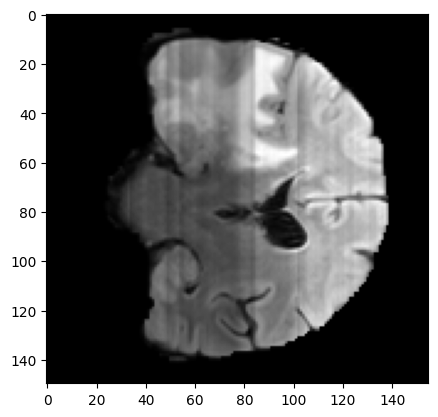

In [8]:
######################
# NORMALIZATION SAMPLE
######################

z_scores = z_score(IMG_FLAIR)
data = gaussian_norm(z_scores)

plt.imshow(data[45:195,135,:], 'gray')

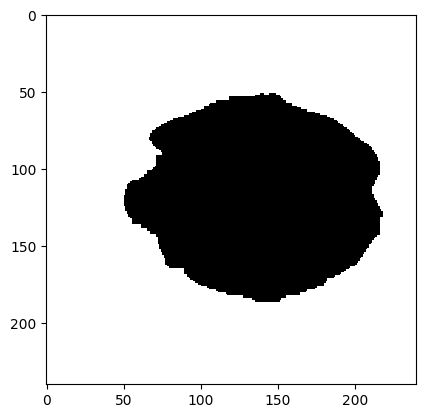

In [9]:
#######################
# 3D BACKGROUND REGIONS
#######################
T_core, E_core, W_core = classify_segments(IMG_SEG)
background,  non_tumor = classify_background_and_non_tumor(data, W_core)

plt.imshow(background[:,:,60], 'gray')

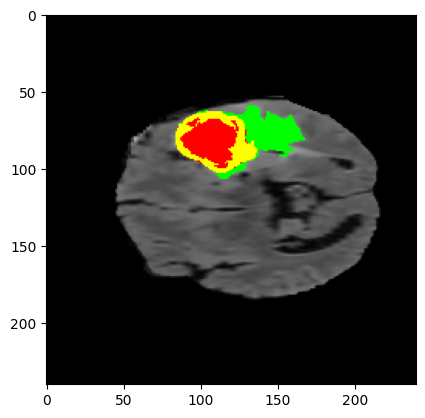

In [10]:
###################
# TUMOR OVERLAYING
###################

res = results_image(data[:,:,67:68], T_core[:,:,67:68], E_core[:,:,67:68], W_core[:,:,67:68])

plt.imshow(res[:,:], 'gray')

### Loading and visualizing from the Fold Folder

In [11]:
path = fold_data + "3/61/X.npy"
test = np.load(path)
test = test[:,:,:,:4]
test.shape

(82, 192, 192, 4)

In [12]:
visualize_data(test)